In [1]:
%matplotlib inline 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt # module for plotting 
import seaborn as sns
import datetime
import re
import matplotlib as mpl
from mpl_toolkits.basemap import Basemap
import matplotlib.cm as cm
from scipy.stats import norm

# Use the following only if you are on a high definition device
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

# The current version of NumPy available from conda is issuing a warning 
# message that some behavior will change in the future when used with the 
# current version of matplotlib available from conda. This cell just keeps
# that warning from being displayed.
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)


# Sure-fire way to turn off interactive mode in a Jupyter notebook

plt.ioff()
# Get a reference to the current IPython shell
shell = get_ipython()
# Import the event handler function that we are trying to unregister
from ipykernel.pylab.backend_inline import flush_figures
# Unregister the event handler for the current shell session
shell.events.unregister('post_execute', flush_figures)


In [2]:
# Load in train data. There are 9 columns: Dates,Descprit, DayOfWeek, PdDistrict, Resolution, Address
# X, Y, and Category which is the dependent variable.Descript and Resolution only appear in train data.
path = './'
train = pd.read_csv(path+'train.csv')
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [3]:
test = pd.read_csv(path+'test.csv')
test.head()
# The test data has 6 variables in common. 

,Id,Dates,DayOfWeek,PdDistrict,Address,X,Y
0,0,2015-05-10 23:59:00,Sunday,BAYVIEW,2000 Block of THOMAS AV,-122.399588,37.735051
1,1,2015-05-10 23:51:00,Sunday,BAYVIEW,3RD ST / REVERE AV,-122.391523,37.732432
2,2,2015-05-10 23:50:00,Sunday,NORTHERN,2000 Block of GOUGH ST,-122.426002,37.792212
3,3,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412
4,4,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412


In [4]:
# The dtypes of the feature 'DateTime' is object, we need to convert its type to datetime to be able
# to manipulate it. 
train['Dates'] = pd.to_datetime(train['Dates'])
test['Dates'] = pd.to_datetime(test['Dates'])
train['Dates'].head()

0   2015-05-13 23:53:00
1   2015-05-13 23:53:00
2   2015-05-13 23:33:00
3   2015-05-13 23:30:00
4   2015-05-13 23:30:00
Name: Dates, dtype: datetime64[ns]

In [5]:
# Write a function to add 'Year','Month','Day','Hour','Minute','Second','Detla_date' as independent variables
def tfunc(df,attr='None',aggr='None',**kwargs):
    if ((attr=='None') or (aggr=='None')):
        print ('No conversion made!')
        return
    else:
        if aggr=='Year':
            return df[attr].apply(lambda x: x.year)
        elif aggr == 'Month':
            return df[attr].apply(lambda x: x.month)
        elif aggr == 'Day':
            return df[attr].apply(lambda x: x.day)
        elif aggr == 'Hour':
            return df[attr].apply(lambda x: x.hour)
        elif aggr == 'Minute':
            return df[attr].apply(lambda x: x.minute)
        elif aggr == 'Second':
            return df[attr].apply(lambda x: x.second)
        elif aggr =='Delta_date':
            return (df[attr]-get_dt(df[attr],'min')).apply(lambda x: x.days)
        else:
            print ('Exception!')
        return
    
def get_dt(vec,method='min'):
    if method=='min':
        return vec.min()
    else:
        return

In [6]:
batch_opr = ['Year','Month','Day','Delta_date','Hour','Minute','Second']
for var in batch_opr:
    train[var]=tfunc(train,'Dates',var)
    test[var]=tfunc(test,'Dates',var)

In [7]:
# There are 2 types of addresses. One is like '# Block of XXX ST'; The other is like 'XXX ST / XXX AV'.
street_features = ['Block#','Street','Junc_rd1','Junc_rd2']
for var in street_features:
    if var == 'Block#':
        train[var]=0
        test[var]=0
    else:
        train[var]='None'
        test[var]='None'

In [8]:
# function 'search_street' uses re to 
def search_street(tc):
    if 'Block of ' in tc:
        m1 = re.search('([\d]+) Block of ([\w ]+)',tc)
        outcome = [m1.group(1),m1.group(2)]
    else:
        outcome = [-100,'None']
    if ' / ' in tc:
        m2 = re.search('([\w ]+) / ([\w ]+)',tc)
        outcome.extend([m2.group(1),m2.group(2)])
    else:
        outcome.extend(['None','None'])
    return outcome

def decompose_street(df):
    df.loc[:,['Block#','Street','Junc_rd1','Junc_rd2']]=list(df['Address'].apply(search_street))
    

In [9]:
decompose_street(train)
decompose_street(test)

In [15]:
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Year,Month,Day,Delta_date,Hour,Minute,Second,Block#,Street,Junc_rd1,Junc_rd2
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,4510,23,53,0,-100,None,OAK ST,LAGUNA ST
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,4510,23,53,0,-100,None,OAK ST,LAGUNA ST
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414,2015,5,13,4510,23,33,0,-100,None,VANNESS AV,GREENWICH ST
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873,2015,5,13,4510,23,30,0,1500,LOMBARD ST,None,None
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541,2015,5,13,4510,23,30,0,100,BRODERICK ST,None,None


In [16]:
# 2 Data Exploration

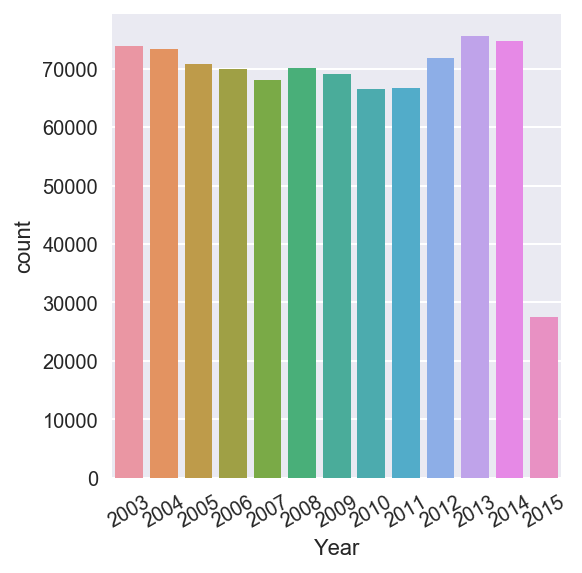

In [17]:
grid=sns.factorplot(data=train,x='Year',kind='count')
plt.xticks(rotation=30)
plt.show()

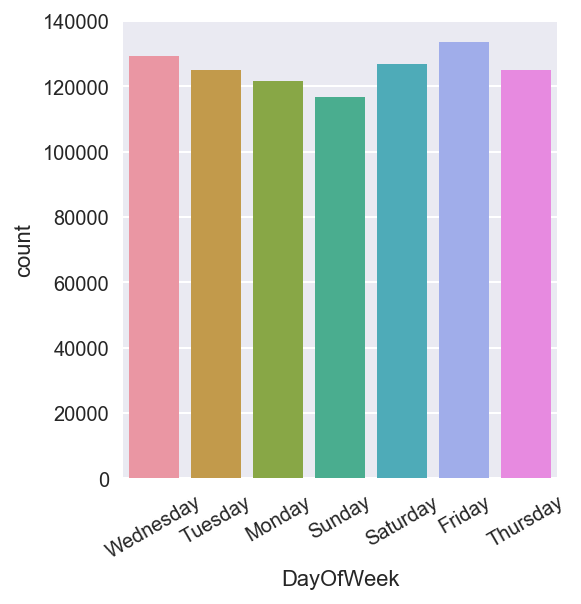

In [18]:
grid=sns.factorplot(data=train,x='DayOfWeek',kind='count')
plt.xticks(rotation=30)
plt.show()

In [19]:
train['Block#'].min()

-100

In [20]:
train.head(10)

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Year,Month,Day,Delta_date,Hour,Minute,Second,Block#,Street,Junc_rd1,Junc_rd2
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,4510,23,53,0,-100,None,OAK ST,LAGUNA ST
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,4510,23,53,0,-100,None,OAK ST,LAGUNA ST
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414,2015,5,13,4510,23,33,0,-100,None,VANNESS AV,GREENWICH ST
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873,2015,5,13,4510,23,30,0,1500,LOMBARD ST,None,None
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541,2015,5,13,4510,23,30,0,100,BRODERICK ST,None,None
5,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM UNLOCKED AUTO,Wednesday,INGLESIDE,NONE,0 Block of TEDDY AV,-122.403252,37.713431,2015,5,13,4510,23,30,0,0,TEDDY AV,None,None
6,2015-05-13 23:30:00,VEHICLE THEFT,STOLEN AUTOMOBILE,Wednesday,INGLESIDE,NONE,AVALON AV / PERU AV,-122.423327,37.725138,2015,5,13,4510,23,30,0,-100,None,AVALON AV,PERU AV
7,2015-05-13 23:30:00,VEHICLE THEFT,STOLEN AUTOMOBILE,Wednesday,BAYVIEW,NONE,KIRKWOOD AV / DONAHUE ST,-122.371274,37.727564,2015,5,13,4510,23,30,0,-100,None,KIRKWOOD AV,DONAHUE ST
8,2015-05-13 23:00:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,RICHMOND,NONE,600 Block of 47TH AV,-122.508194,37.776601,2015,5,13,4510,23,0,0,600,47TH AV,None,None
9,2015-05-13 23:00:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,CENTRAL,NONE,JEFFERSON ST / LEAVENWORTH ST,-122.419088,37.807802,2015,5,13,4510,23,0,0,-100,None,JEFFERSON ST,LEAVENWORTH ST


In [21]:
train['Category'].unique()

array(['WARRANTS', 'OTHER OFFENSES', 'LARCENY/THEFT', 'VEHICLE THEFT',
       'VANDALISM', 'NON-CRIMINAL', 'ROBBERY', 'ASSAULT', 'WEAPON LAWS',
       'BURGLARY', 'SUSPICIOUS OCC', 'DRUNKENNESS',
       'FORGERY/COUNTERFEITING', 'DRUG/NARCOTIC', 'STOLEN PROPERTY',
       'SECONDARY CODES', 'TRESPASS', 'MISSING PERSON', 'FRAUD',
       'KIDNAPPING', 'RUNAWAY', 'DRIVING UNDER THE INFLUENCE',
       'SEX OFFENSES FORCIBLE', 'PROSTITUTION', 'DISORDERLY CONDUCT',
       'ARSON', 'FAMILY OFFENSES', 'LIQUOR LAWS', 'BRIBERY',
       'EMBEZZLEMENT', 'SUICIDE', 'LOITERING', 'SEX OFFENSES NON FORCIBLE',
       'EXTORTION', 'GAMBLING', 'BAD CHECKS', 'TREA', 'RECOVERED VEHICLE',
       'PORNOGRAPHY/OBSCENE MAT'], dtype=object)

In [22]:
train['Category'].value_counts()

LARCENY/THEFT                  174900
OTHER OFFENSES                 126182
NON-CRIMINAL                    92304
ASSAULT                         76876
DRUG/NARCOTIC                   53971
VEHICLE THEFT                   53781
VANDALISM                       44725
WARRANTS                        42214
BURGLARY                        36755
SUSPICIOUS OCC                  31414
MISSING PERSON                  25989
ROBBERY                         23000
FRAUD                           16679
FORGERY/COUNTERFEITING          10609
SECONDARY CODES                  9985
WEAPON LAWS                      8555
PROSTITUTION                     7484
TRESPASS                         7326
STOLEN PROPERTY                  4540
SEX OFFENSES FORCIBLE            4388
DISORDERLY CONDUCT               4320
DRUNKENNESS                      4280
RECOVERED VEHICLE                3138
KIDNAPPING                       2341
DRIVING UNDER THE INFLUENCE      2268
RUNAWAY                          1946
LIQUOR LAWS 

In [23]:
train['Category'].value_counts(ascending=True).plot(kind='barh',figsize=(10,7.5))

In [24]:
train[train['Category']=='OTHER OFFENSES']['Descript'].value_counts()

DRIVERS LICENSE, SUSPENDED OR REVOKED                                        26839
TRAFFIC VIOLATION                                                            16471
RESISTING ARREST                                                              8983
MISCELLANEOUS INVESTIGATION                                                   8389
PROBATION VIOLATION                                                           8016
LOST/STOLEN LICENSE PLATE                                                     6424
VIOLATION OF RESTRAINING ORDER                                                5816
PAROLE VIOLATION                                                              5119
TRAFFIC VIOLATION ARREST                                                      5051
CONSPIRACY                                                                    3114
OBSCENE PHONE CALLS(S)                                                        2492
FALSE PERSONATION TO RECEIVE MONEY OR PROPERTY                                2339
VIOL

In [25]:
# San Franciso Crime Map

In [26]:
# Create a basemap with the bounding box and 'World Mercator Projection'
sf_map = Basemap(urcrnrlat=37.821981,     # top
              urcrnrlon=-122.343189,   # bottom
              llcrnrlat=37.697940,     # left
              llcrnrlon=-122.536498,   # right
              epsg=3857)

In [27]:
# These are the dimensions of the map we'll create
width = 20
height = 10

fig = plt.gcf()
fig.set_size_inches(width, height);

# The default DPI setting is 96, we're just specifying it here 
# to use it for calculating the number of x-axis pixels to request.
dpi = 96
xpixels = dpi * width


C:\Users\huang\Anaconda2\lib\site-packages\mpl_toolkits\basemap\__init__.py:3296: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
C:\Users\huang\Anaconda2\lib\site-packages\mpl_toolkits\basemap\__init__.py:3305: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


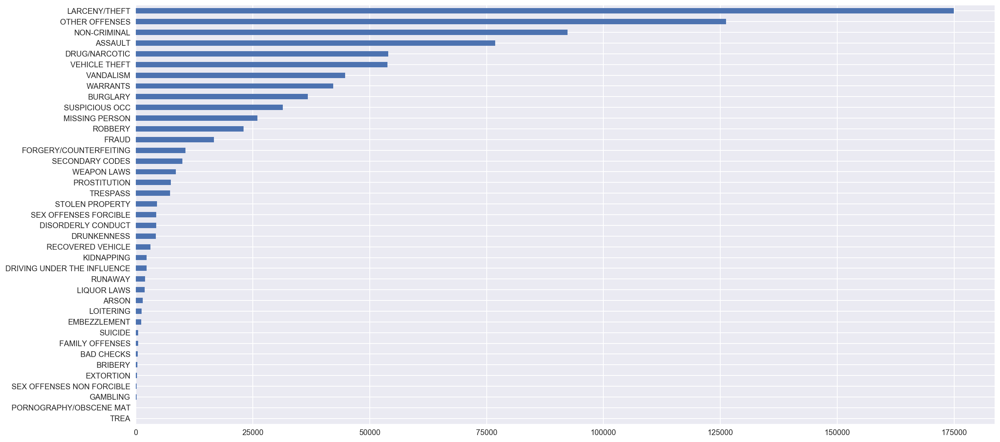

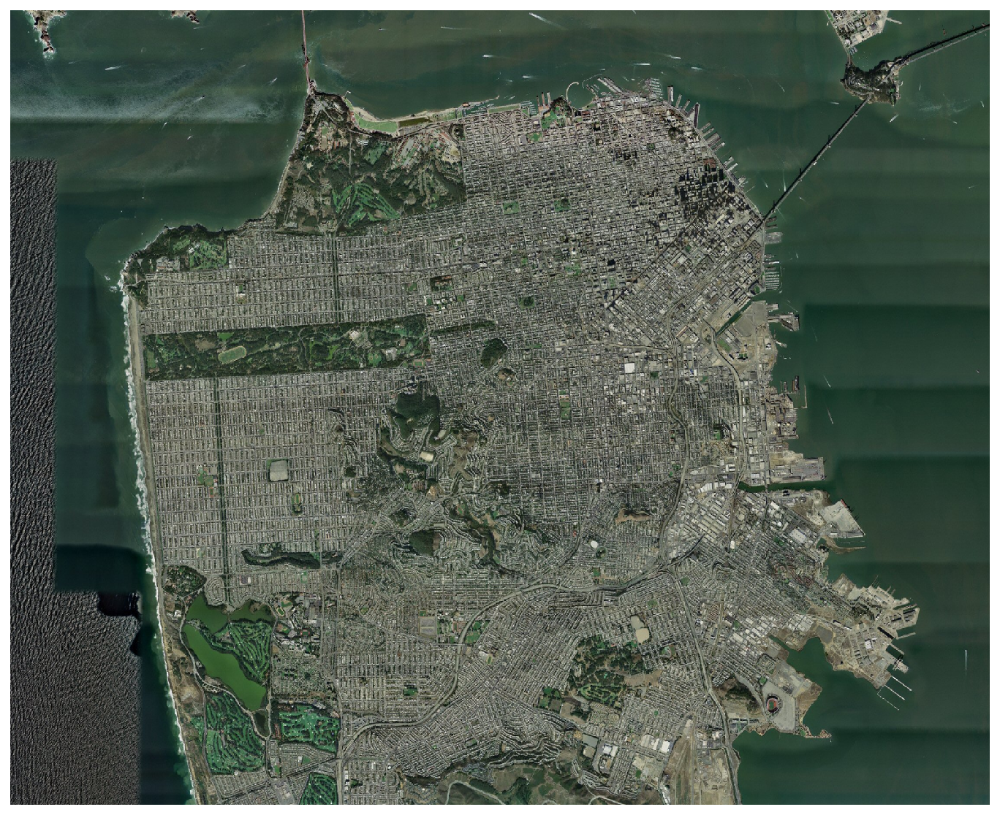

In [28]:
plt.figure(figsize=(20,10))
sf_map.arcgisimage(service='ESRI_Imagery_World_2D', xpixels=xpixels)
plt.show();
# A illustration of satelite image of San Francisco

In [29]:
# Convert crime location from geographic coordinate (lattitude, longitude) to Cartesian coordinate (X,Y)
lon = train['X'].values
lat = train['Y'].values
x,y = sf_map(lon,lat)

C:\Users\huang\Anaconda2\lib\site-packages\mpl_toolkits\basemap\__init__.py:3222: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
C:\Users\huang\Anaconda2\lib\site-packages\mpl_toolkits\basemap\__init__.py:3231: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


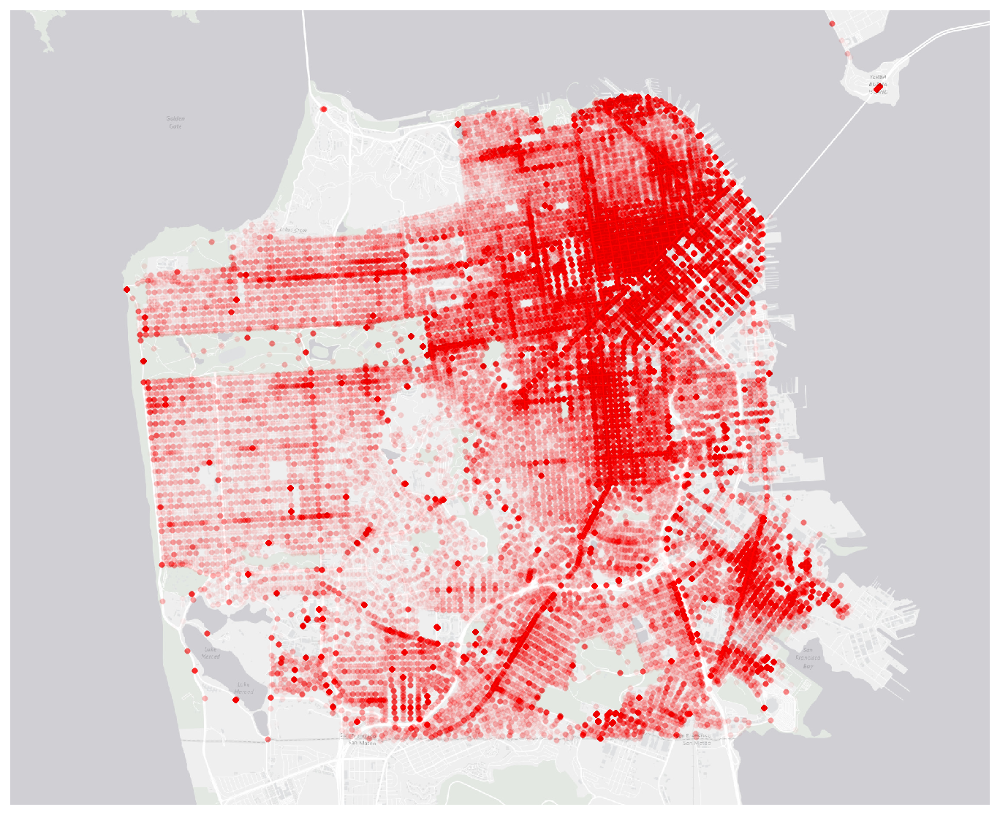

In [30]:
# Show the dot density map of crime overlay on a San Franciso base map. Looks like the NorthEast of SF is more densed in 
# crime rate than other areas. 
plt.gcf().set_size_inches(width, height)
sf_map.arcgisimage(service='Canvas/World_Light_Gray_Base', xpixels=xpixels)
sf_map.scatter(x, y, c='r', alpha=0.01, marker='o', s=15, linewidths=0)
plt.show()

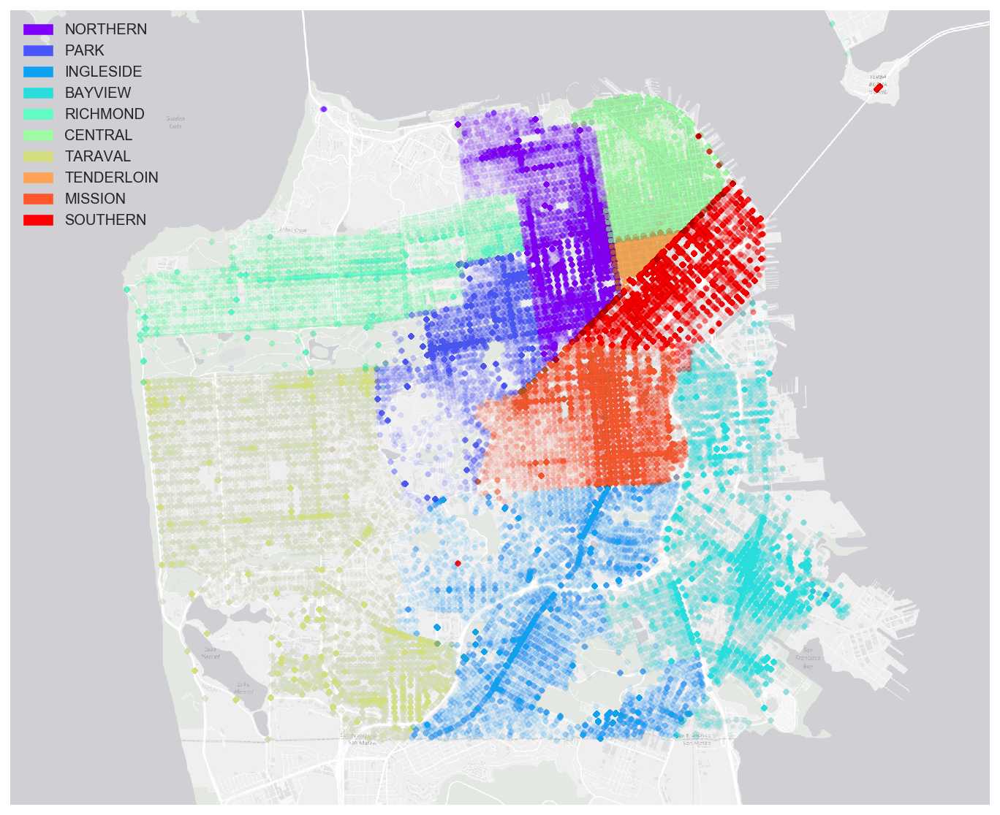

In [31]:
# Plot Crime density scatter categorized by police station.  

labels = train['PdDistrict'].unique()
colors = cm.rainbow(np.linspace(0, 1, len(labels)))
plt.gcf().set_size_inches(width, height)
sf_map.arcgisimage(service='Canvas/World_Light_Gray_Base', xpixels=xpixels)
color_patch=[]
for l,c in zip(labels,colors):
    lon = train[train['PdDistrict']==l]['X'].values
    lat = train[train['PdDistrict']==l]['Y'].values
    x,y = sf_map(lon,lat)
    sf_map.scatter(x,y,color=c,label=l,alpha=0.01, marker='o', s=15, linewidths=0)
    color_patch.append(mpl.patches.Patch(color=c, label=l))
plt.legend(handles=color_patch, loc=2)
plt.show()



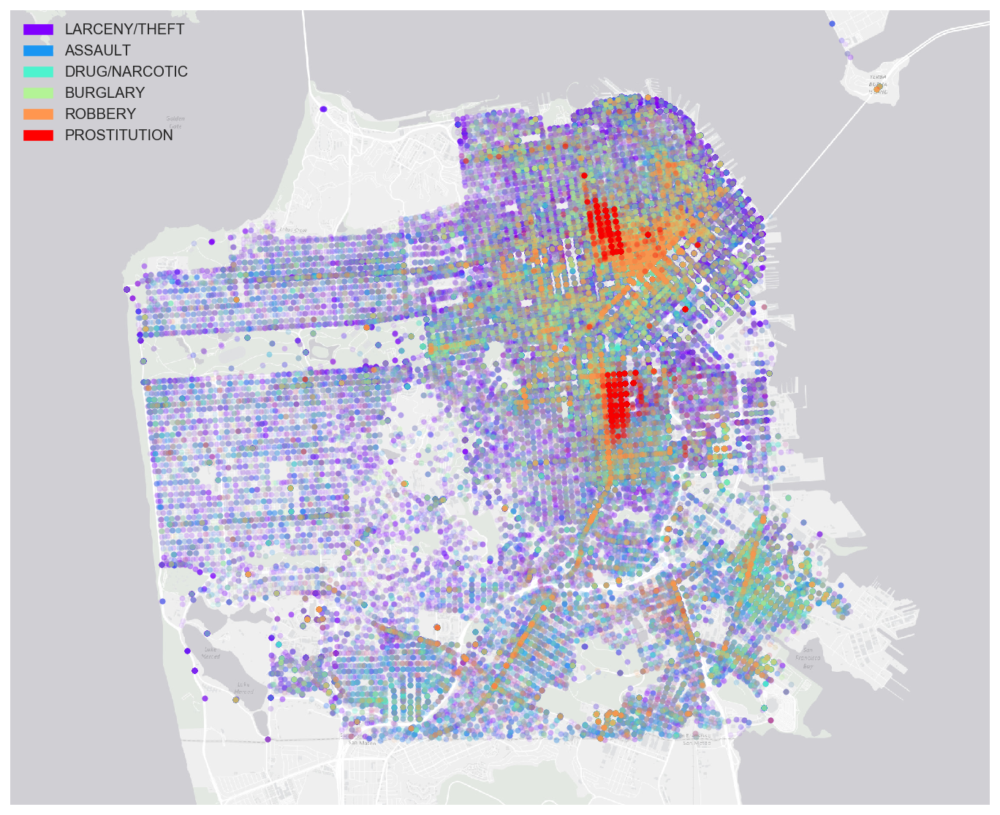

In [32]:
top_crime_cate = ['LARCENY/THEFT','ASSAULT','DRUG/NARCOTIC','BURGLARY',
                  'ROBBERY','PROSTITUTION']
norm = mpl.colors.Normalize(vmin=0, vmax=1)
colors = cm.rainbow(norm(np.linspace(0, 1, len(top_crime_cate))))
plt.gcf().set_size_inches(width, height)
sf_map.arcgisimage(service='Canvas/World_Light_Gray_Base', xpixels=xpixels)
color_patch=[]
for l,c in zip(top_crime_cate,colors):
    lon = train[train['Category']==l]['X'].values
    lat = train[train['Category']==l]['Y'].values
    x,y = sf_map(lon,lat)
    sf_map.scatter(x,y,color=c,label=l,alpha=0.1, marker='o', s=15, linewidths=0)
    color_patch.append(mpl.patches.Patch(color=c, label=l))
plt.legend(handles=color_patch, loc=2)
plt.show()

In [33]:
# Feature Engineering

In [34]:
# Calculate frequency of each level, and combine levels with frequency less than 5%
def combine_rare_levels(df,abs_counts=False,thres=0.05):
    tb = pd.DataFrame(df.value_counts())
    tb.columns=['Count']
    all_levels = tb.index.values
    if abs_counts==False:
        tb['Freq']=tb['Count']/tb['Count'].sum()
        rare_levels = tb[tb['Freq']<=thres].index.values
    elif abs_counts==True:
        rare_levels = tb[tb['Count']<=thres].index.values
    
    convert_map = {}
    for lv in all_levels:
        if lv in rare_levels:
            convert_map[lv]='Rare'
        else:
            convert_map[lv]=lv
    return convert_map

In [35]:
def plot_hist(df,title,bins=10,xscale='log',yscale='log'):
    plt.hist(df,bins=bins)
    if xscale=='log':
        plt.xscale('log')
        
    if yscale=='log':
        plt.yscale('log')
    plt.title('Distribution of ' +title)
    plt.ylabel('Counts')
    plt.xlabel('Level Counts')
    plt.show()

In [36]:
# There are around 2000 levels in 'Street' variable
train['Street'].value_counts().shape

(1991L,)

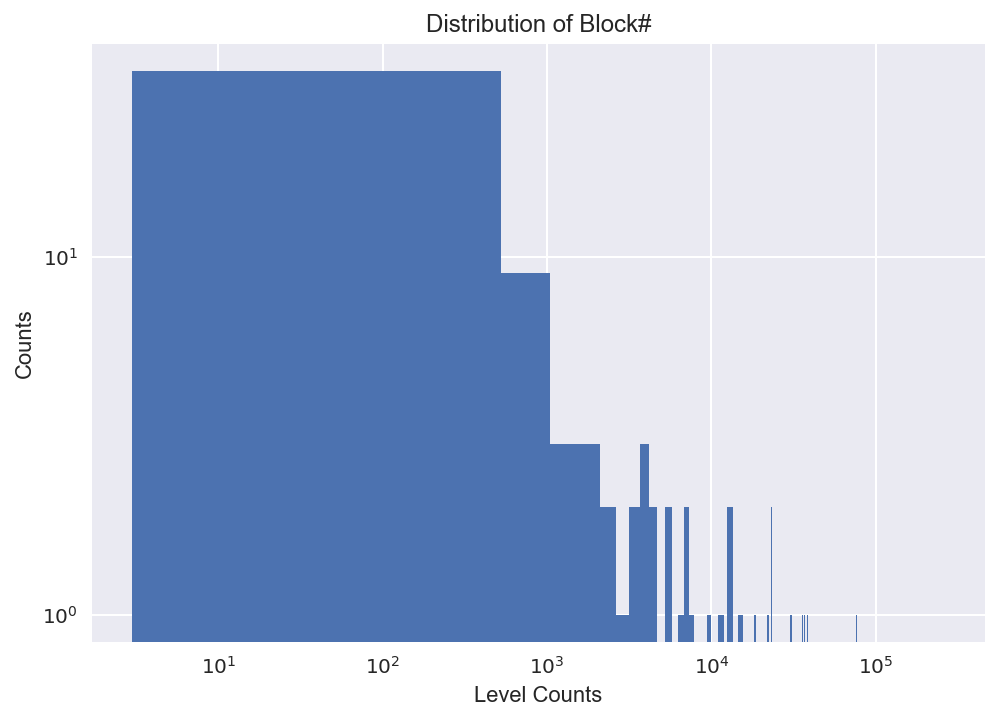

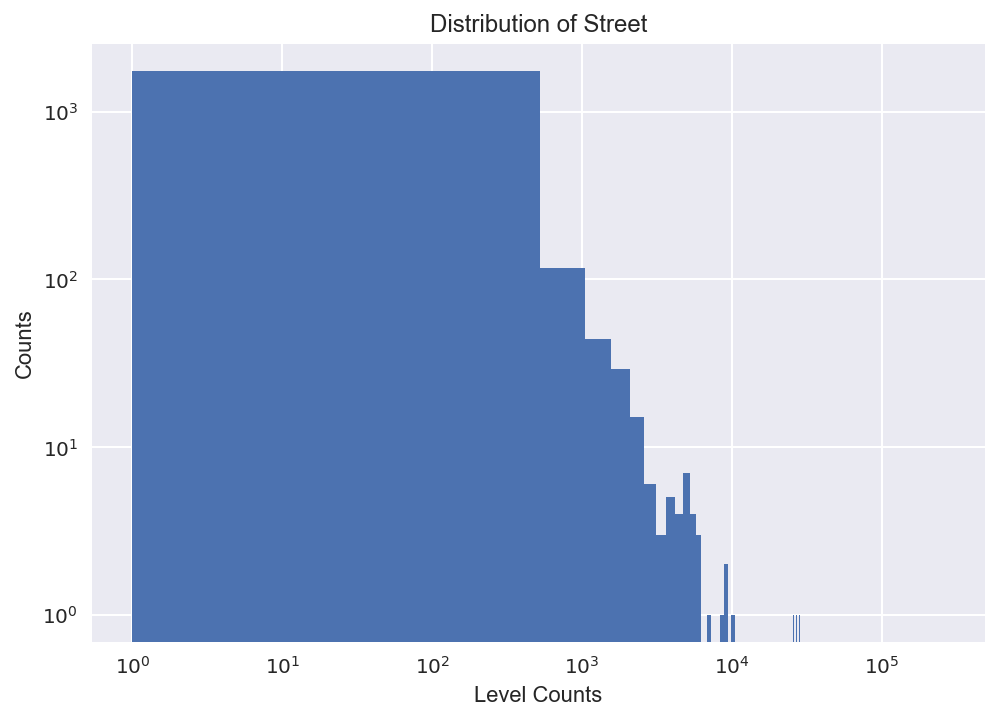

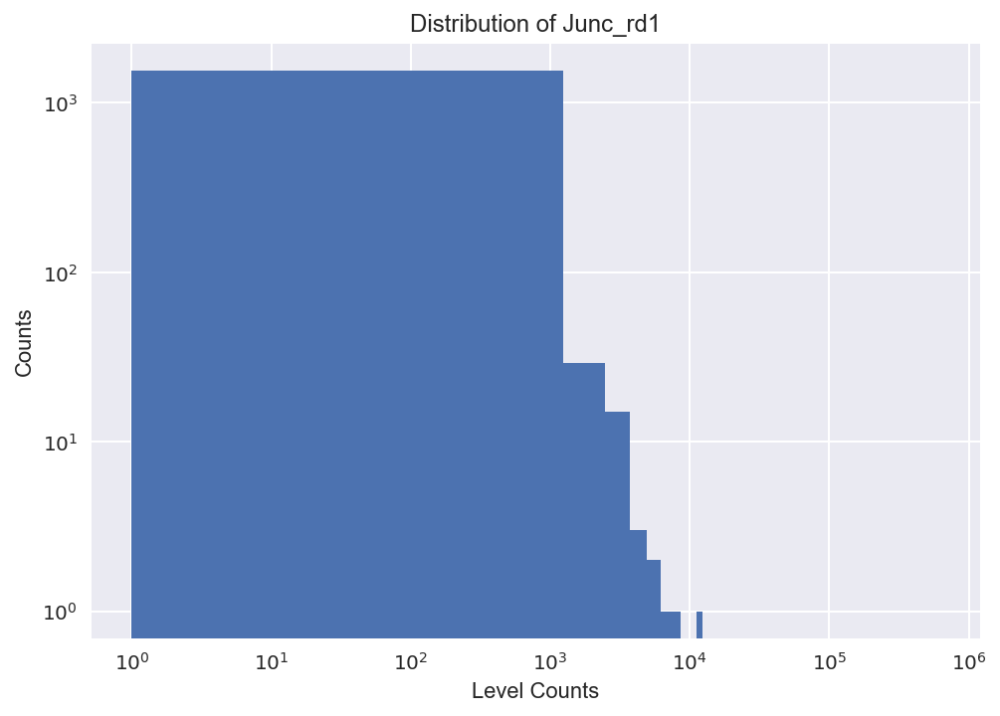

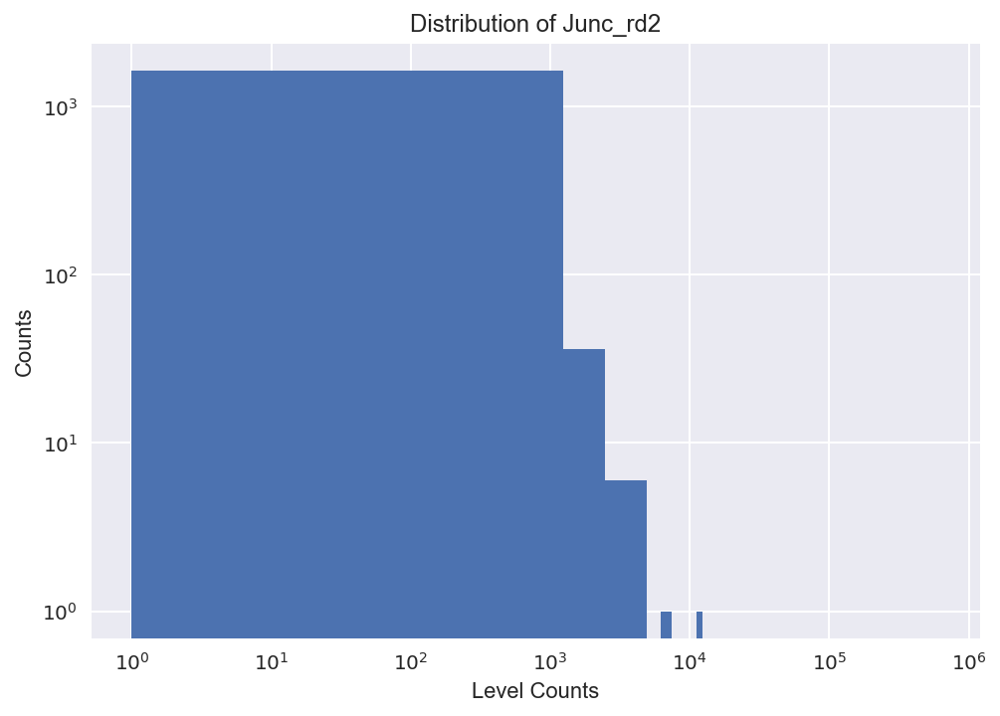

In [37]:
# Check the histogram of level counts of the below variables. 
for param in ['Block#', 'Street', 'Junc_rd1', 'Junc_rd2']:
    plot_hist(train[param].value_counts(),param,500,'log','log')

# More than half of the levels are within low occurrence regime (recurrence<100), we can combine them together. 
    

In [38]:
street_conversion = combine_rare_levels(train['Street'],abs_counts=True,thres=100)
junc1_conversion = combine_rare_levels(train['Junc_rd1'],abs_counts=True,thres=100)
junc2_conversion = combine_rare_levels(train['Junc_rd2'],abs_counts=True,thres=100)
train['Street']=train['Street'].map(street_conversion)
train['Junc_rd1']=train['Junc_rd1'].map(junc1_conversion)
train['Junc_rd2']=train['Junc_rd2'].map(junc2_conversion)

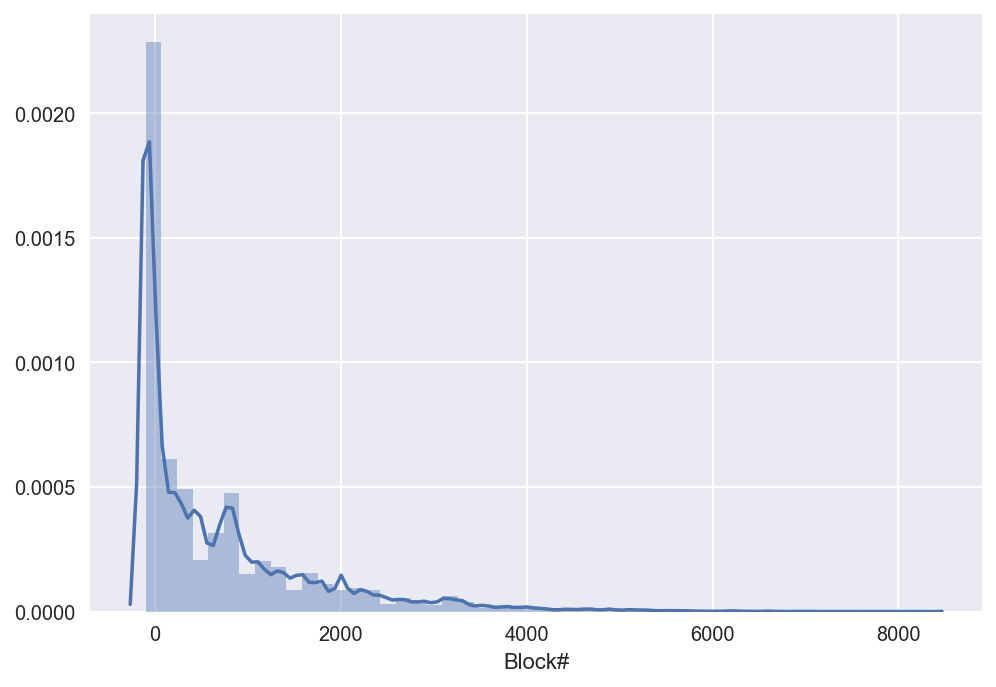

In [39]:
train['Block#']= pd.to_numeric(train['Block#'],errors='coerce')
sns.distplot(train['Block#'])
plt.show()

In [40]:
numeric_features = ['Year','Month','Day','Delta_date','Hour','Minute']
categorical_features = ['DayOfWeek','PdDistrict']

In [41]:
train_num = train[numeric_features]
train_cat = train[categorical_features]

In [42]:
train_num = (train_num-train_num.mean())/train_num.std()

In [43]:
train_cat = pd.get_dummies(train_cat,drop_first=True)
train_cat.shape

(878049, 15)

In [44]:
# Input the y vector and number of levels of multiple classification, return a matrix representation for one vs. all. 
def matrix_repr(li,levels):
    cols=len(li)
    matrix=np.array([li,]*levels).transpose()
    dummy=np.array([range(levels)]*cols)
    return (matrix==dummy).astype(int)
    

In [45]:
# Input Pandas Series, and return conversion map from original values to 0~m 
def cate_convert(df):
    levels = len(df.unique())
    convert_map = {}
    for i, var in enumerate(df.unique()):
        convert_map[var]=i
    return convert_map

In [46]:
# Modeling

In [47]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split

In [48]:
X = pd.concat([train_num,train_cat],axis=1)
y = LabelEncoder().fit_transform(train['Category'])
Xtrain,Xtest,ytrain,ytest = train_test_split(X,y,test_size=0.33,random_state=42)

In [42]:
# Multinomial logistic regression

In [44]:
lr = LogisticRegression(solver='sag', max_iter=100,multi_class='multinomial')
C = [0.01, 0.1, 1]
tuned_parameters = [{'C':C}]
n_folds = 3

clf = GridSearchCV(lr,tuned_parameters,scoring = 'neg_log_loss',cv=n_folds)
clf.fit(Xtrain,ytrain)
scores = clf.cv_results_['mean_test_score']
scores



array([-2.56720117, -2.56453801, -2.56434985])

In [45]:
clf.cv_results_

{'mean_fit_time': array([ 30.51033338,  40.52866666,  79.63866671]),
 'mean_score_time': array([ 0.42033331,  0.44966666,  0.42533326]),
 'mean_test_score': array([-2.56720117, -2.56453801, -2.56434985]),
 'mean_train_score': array([-2.56601783, -2.56294534, -2.56254553]),
 'param_C': masked_array(data = [0.01 0.1 1],
              mask = [False False False],
        fill_value = ?),
 'params': ({'C': 0.01}, {'C': 0.1}, {'C': 1}),
 'rank_test_score': array([3, 2, 1]),
 'split0_test_score': array([-2.56860781, -2.56581139, -2.56562007]),
 'split0_train_score': array([-2.56539441, -2.56233153, -2.56192768]),
 'split1_test_score': array([-2.56659793, -2.56403017, -2.56386623]),
 'split1_train_score': array([-2.56626167, -2.56317047, -2.56277058]),
 'split2_test_score': array([-2.56639763, -2.56377233, -2.56356312]),
 'split2_train_score': array([-2.56639742, -2.56333401, -2.56293835]),
 'std_fit_time': array([ 1.85675361,  3.48062647,  5.26823495]),
 'std_score_time': array([ 0.01641814, 

In [46]:
best_estimator = clf.best_estimator_

In [47]:
best_estimator

LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='multinomial',
          n_jobs=1, penalty='l2', random_state=None, solver='sag',
          tol=0.0001, verbose=0, warm_start=False)

In [48]:
prob_ypred=best_estimator.predict_proba(Xtrain)
ypred=best_estimator.predict(Xtrain)

In [49]:
print 'accuracy: ', accuracy_score(ytrain,ypred)
print 'logloss: ', log_loss(ytrain,prob_ypred)

accuracy:  0.23349969063
logloss:  2.56284250507


In [50]:
best_estimator.coef_.shape

(39L, 21L)

In [154]:
# Decision Tree

In [155]:
from sklearn import tree
dt = tree.DecisionTreeClassifier(max_depth=8,min_samples_leaf=1000,max_features=0.7)
dt.fit(Xtrain,ytrain)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=8,
            max_features=0.7, max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1000,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best')

In [156]:
dt_ytrain_pred=dt.predict(Xtrain)
print 'Decision Tree accuracy(Train Set):',accuracy_score(ytrain,dt_ytrain_pred)
dt_ytrain_prob=dt.predict_proba(Xtrain)
print 'Decision Tree log loss(Train Set):',log_loss(ytrain,dt_ytrain_prob)
dt_ytest_pred=dt.predict(Xtest)
print 'Decision Tree accuracy(Test Set):',accuracy_score(ytest,dt_ytest_pred)
dt_ytest_prob=dt.predict_proba(Xtest)
print 'Decision Tree log loss(Test Set):',log_loss(ytest,dt_ytest_prob)


Decision Tree accuracy(Train Set): 0.253848429011
Decision Tree log loss(Train Set): 2.50175004569
Decision Tree accuracy(Test Set): 0.254133636116
Decision Tree log loss(Test Set): 2.52696359964


In [159]:
# Bagging

In [160]:
from sklearn.ensemble import BaggingClassifier
bagging_params={'base_estimator':tree.DecisionTreeClassifier(),'n_estimators':100,'max_samples':0.5,'max_features':0.5,
               'bootstrap':True, 'bootstrap_features':True,'oob_score':True}
bagging = BaggingClassifier(**bagging_params)
bagging.fit(Xtrain,ytrain)

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best'),
         bootstrap=True, bootstrap_features=True, max_features=0.5,
         max_samples=0.5, n_estimators=100, n_jobs=1, oob_score=True,
         random_state=None, verbose=0, warm_start=False)

In [ ]:
print 'Out Of Bag accuracy score is :', bagging.oob_score_

In [ ]:
bg_ytrain_pred=bagging.predict(Xtrain)
print 'Decision Tree accuracy(Train Set):',accuracy_score(ytrain,bg_ytrain_pred)
bg_ytrain_prob=bagging.predict_proba(Xtrain)
print 'Decision Tree log loss(Train Set):',log_loss(ytrain,bg_ytrain_prob)
bg_ytest_pred=bagging.predict(Xtest)
print 'Decision Tree accuracy(Test Set):',accuracy_score(ytest,bg_ytest_pred)
bg_ytest_prob=bagging.predict_proba(Xtest)
print 'Decision Tree log loss(Test Set):',log_loss(ytest,bg_ytest_prob)

In [161]:
# Random Forest

In [44]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(max_depth=2,random_state=0,n_estimators=40,oob_score=True,n_jobs=-1)
rf.fit(Xtrain,ytrain)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=2, max_features='auto', max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=100, n_jobs=-1, oob_score=True, random_state=0,
            verbose=0, warm_start=False)

In [45]:
print 'Out Of Bag accuracy score is :', rf.oob_score_

Out Of Bag accuracy score is : 0.203402392009


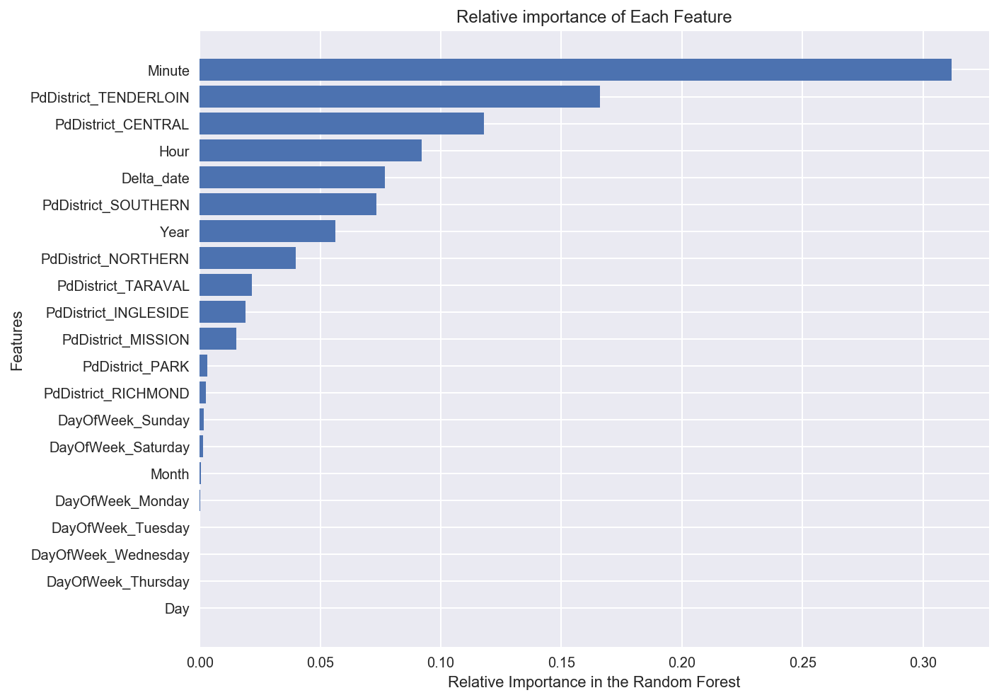

In [46]:
importance_list = rf.feature_importances_
name_list = X.columns
importance_list,name_list = zip(*sorted(zip(importance_list,name_list)))
plt.figure(figsize=(10,8))
plt.barh(range(len(name_list)),importance_list,align='center')
plt.yticks(range(len(name_list)),name_list)
plt.xlabel('Relative Importance in the Random Forest')
plt.ylabel('Features')
plt.title('Relative importance of Each Feature')
plt.show()

In [48]:
rf_ytrain_pred=rf.predict(Xtrain)
print 'Random Forest accuracy(Train Set):',accuracy_score(ytrain,rf_ytrain_pred)
rf_ytrain_prob=rf.predict_proba(Xtrain)
print 'Random Forest log loss(Train Set):',log_loss(ytrain,rf_ytrain_prob)
rf_ytest_pred=rf.predict(Xtest)
print 'Random Forest accuracy(Test Set):',accuracy_score(ytest,rf_ytest_pred)
rf_ytest_prob=rf.predict_proba(Xtest)
print 'Random Forest log loss(Test Set):',log_loss(ytest,rf_ytest_prob)

Random Forest accuracy(Train Set): 0.203162715114
Random Forest log loss(Train Set): 2.62023653782
Random Forest accuracy(Test Set): 0.203822513347
Random Forest log loss(Test Set): 2.61979038843


In [1]:
# Boosting

In [2]:
# AdaBoost

In [51]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

In [56]:
bdt = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1),algorithm='SAMME',n_estimators=200)

In [57]:
bdt.fit(Xtrain,ytrain)

AdaBoostClassifier(algorithm='SAMME',
          base_estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=1,
            max_features=None, max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best'),
          learning_rate=1.0, n_estimators=200, random_state=None)

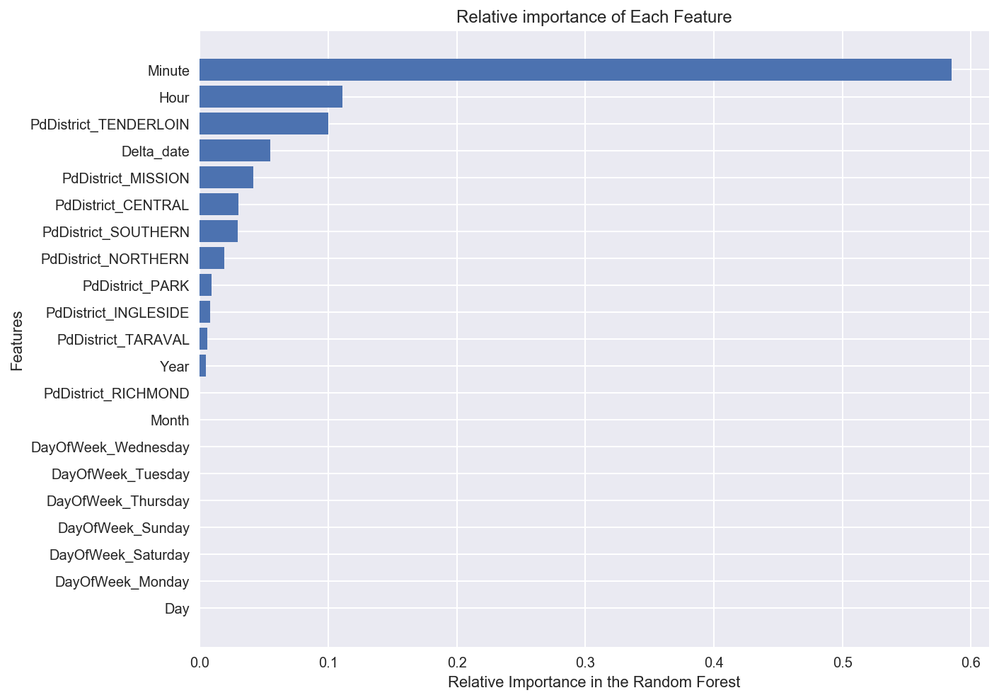

In [58]:
importance_list = bdt.feature_importances_
name_list = X.columns
importance_list,name_list = zip(*sorted(zip(importance_list,name_list)))
plt.figure(figsize=(10,8))
plt.barh(range(len(name_list)),importance_list,align='center')
plt.yticks(range(len(name_list)),name_list)
plt.xlabel('Relative Importance in the Random Forest')
plt.ylabel('Features')
plt.title('Relative importance of Each Feature')
plt.show()

In [59]:
bdt_ytrain_pred=bdt.predict(Xtrain)
print 'AdaBoost accuracy(Train Set):',accuracy_score(ytrain,bdt_ytrain_pred)
bdt_ytrain_prob=bdt.predict_proba(Xtrain)
print 'AdaBoost log loss(Train Set):',log_loss(ytrain,bdt_ytrain_prob)
bdt_ytest_pred=bdt.predict(Xtest)
print 'AdaBoost accuracy(Test Set):',accuracy_score(ytest,bdt_ytest_pred)
bdt_ytest_prob=bdt.predict_proba(Xtest)
print 'AdaBoost log loss(Test Set):',log_loss(ytest,bdt_ytest_prob)

AdaBoost accuracy(Train Set): 0.22063703059
AdaBoost log loss(Train Set): 3.66320911866
AdaBoost accuracy(Test Set): 0.221202593898
AdaBoost log loss(Test Set): 3.66320901466
